#  Cyclistic Bike-Share Data Anaysis Case Study 


# Prepare and process the data

In [1]:
# import Python-relevant software libraries
import pandas as pd
import datetime
import time
import warnings
from pandas.core.common import SettingWithCopyWarning
import plotly.graph_objects as go
from geopy.geocoders import Nominatim
from plotly.subplots import make_subplots
from geopy import distance
from collections import Counter
import os
from itertools import combinations
import networkx as nx
import matplotlib.pyplot as plt
import re
import plotly.express as px
import numpy as np
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

In [2]:
# access the bike-share folder on the computer.
path = os.chdir(os.environ['PATH'])
files = os.listdir(path)

In [3]:
# get files names and store them in a a list named files
files = [file for file in files if file.startswith('2')]
sorted(files)

['202001-divvy-tripdata.csv',
 '202002-divvy-tripdata.csv',
 '202003-divvy-tripdata.csv',
 '202004-divvy-tripdata.csv',
 '202005-divvy-tripdata.csv',
 '202006-divvy-tripdata.csv',
 '202007-divvy-tripdata.csv',
 '202008-divvy-tripdata.csv',
 '202009-divvy-tripdata.csv',
 '202010-divvy-tripdata.csv',
 '202011-divvy-tripdata.csv',
 '202012-divvy-tripdata.csv',
 '202101-divvy-tripdata.csv',
 '202102-divvy-tripdata.csv',
 '202103-divvy-tripdata.csv',
 '202104-divvy-tripdata.csv',
 '202105-divvy-tripdata.csv',
 '202106-divvy-tripdata.csv',
 '202107-divvy-tripdata.csv',
 '202108-divvy-tripdata.csv',
 '202109-divvy-tripdata.csv',
 '202110-divvy-tripdata.csv',
 '202111-divvy-tripdata.csv',
 '202112-divvy-tripdata.csv']

In [4]:
# wrangle data and combine them into a single file
df = pd.concat(pd.read_csv(file) for file in files)

In [5]:
# verify that the sum of row count in each dataset is equivalent to the total row count of the concatenated dataset and the columns 
# are the same.
total_row_count = 0
all_columns = []
for file in files:
    dataset = pd.read_csv(file)
    total_row_count += dataset.shape[0]
    all_columns.append(list(dataset.columns))

In [6]:
# make sure that the number of rows in each dataset match
df.shape[0] == total_row_count

True

In [7]:
# make sure that the number of columns in each dataset match
Counter([x for y in all_columns for x in y])

Counter({'ride_id': 24,
         'rideable_type': 24,
         'started_at': 24,
         'ended_at': 24,
         'start_station_name': 24,
         'start_station_id': 24,
         'end_station_name': 24,
         'end_station_id': 24,
         'start_lat': 24,
         'start_lng': 24,
         'end_lat': 24,
         'end_lng': 24,
         'member_casual': 24})

In [8]:
# get columns names 
list(df.columns)

['ride_id',
 'rideable_type',
 'started_at',
 'ended_at',
 'start_station_name',
 'start_station_id',
 'end_station_name',
 'end_station_id',
 'start_lat',
 'start_lng',
 'end_lat',
 'end_lng',
 'member_casual']

In [9]:
# check for duplicate values
len(df[df['ride_id'].duplicated() == True])

209

In [10]:
# extract the ride_id number of the duplicated values
# lst = list(df[df['ride_id'].duplicated() == True]['ride_id'])

In [11]:
# define a condition to exclude the duplicated value with the unusual ride length
# duplicates = (df['ride_id'].isin(lst)) & (df['time_in_minute'] > 27000)

In [12]:
# drop duplicate values
# df = df[~duplicates]

In [13]:
# or use the panda's dro_duplicates method to drop duplicate values
df = df.drop_duplicates(subset='ride_id')

In [14]:
# get the shape of the dataset
df.shape

(9136537, 13)

In [15]:
# check the data types
df.dtypes

ride_id                object
rideable_type          object
started_at             object
ended_at               object
start_station_name     object
start_station_id       object
end_station_name       object
end_station_id         object
start_lat             float64
start_lng             float64
end_lat               float64
end_lng               float64
member_casual          object
dtype: object

In [16]:
# look for missing valeus
df.isna().sum()

ride_id                    0
rideable_type              0
started_at                 0
ended_at                   0
start_station_name    785465
start_station_id      786088
end_station_name      850050
end_station_id        850511
start_lat                  0
start_lng                  0
end_lat                 9025
end_lng                 9025
member_casual              0
dtype: int64

In [17]:
# total missing values in the start and end stations names and ID as well as the end lattitude and longitude
df.isna().sum().sum()

3290164

In [18]:
# preview the data
df.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual
0,BD0A6FF6FFF9B921,electric_bike,2020-11-01 13:36:00,2020-11-01 13:45:40,Dearborn St & Erie St,110,St. Clair St & Erie St,211,41.894177,-87.629127,41.894434,-87.623379,casual
1,96A7A7A4BDE4F82D,electric_bike,2020-11-01 10:03:26,2020-11-01 10:14:45,Franklin St & Illinois St,672,Noble St & Milwaukee Ave,29,41.890959,-87.635343,41.900675,-87.662480,casual
2,C61526D06582BDC5,electric_bike,2020-11-01 00:34:05,2020-11-01 01:03:06,Lake Shore Dr & Monroe St,76,Federal St & Polk St,41,41.880983,-87.616754,41.872054,-87.629550,casual
3,E533E89C32080B9E,electric_bike,2020-11-01 00:45:16,2020-11-01 00:54:31,Leavitt St & Chicago Ave,659,Stave St & Armitage Ave,185,41.895499,-87.682013,41.917744,-87.691392,casual
4,1C9F4EF18C168C60,electric_bike,2020-11-01 15:43:25,2020-11-01 16:16:52,Buckingham Fountain,2,Buckingham Fountain,2,41.876497,-87.620358,41.876448,-87.620338,casual


# Analyze the dataset

In [19]:
# frequency of each rider's type
df['member_casual'].value_counts().round(2)

member    5240982
casual    3895555
Name: member_casual, dtype: int64

In [20]:
# percentage of each rider's type
df['member_casual'].value_counts(normalize=True).round(2)

member    0.57
casual    0.43
Name: member_casual, dtype: float64

In [21]:
# percentage of each bike type
df['rideable_type'].value_counts(normalize=True).round(2)

classic_bike     0.36
docked_bike      0.36
electric_bike    0.28
Name: rideable_type, dtype: float64

In [22]:
# frequency of each rider's type given the bike type
df.groupby(['member_casual', 'rideable_type'])['ride_id'].count()

member_casual  rideable_type
casual         classic_bike     1277976
               docked_bike      1458347
               electric_bike    1159232
member         classic_bike     2043668
               docked_bike      1820109
               electric_bike    1377205
Name: ride_id, dtype: int64

In [23]:
# convert the start and end dates into datetime format
df[['started_at','ended_at']] = df[['started_at','ended_at']].apply(pd.to_datetime)

In [24]:
# get the first ride start date 
df[['started_at']].min()

started_at   2020-01-01 00:04:00
dtype: datetime64[ns]

In [25]:
# the last ride made was just few seconds from the new year eve
df[['started_at']].max()

started_at   2021-12-31 23:59:48
dtype: datetime64[ns]

In [26]:
# the difference between the first and last rides is 730 days
df[['started_at']].max() - df[['started_at']].min()

started_at   730 days 23:55:48
dtype: timedelta64[ns]

In [27]:
# check to see if there're any occurances where the start date in larger than the end date
len(df[df['started_at'] > df['ended_at']])

10623

In [28]:
# keep only the the type of the bike
df['rideable_type'] = df['rideable_type'].apply(lambda x: re.findall('^[^_]+(?=_)', x)[0].title())                                            

In [29]:
# Since some stations' names are simply a number instead of a string, i added an 
# if statment in the lambda function in order to account for that. 
df['start_station_name'] = df['start_station_name'].apply(lambda x: x.strip().title() if \
                                                        type(x) != float else x)
df['end_station_name'] = df['end_station_name'].apply(lambda x: x.strip().title() if \
                                                        type(x) != float else x)

In [30]:
# make the first letter of member type uppercase 
df['member_casual'] = df['member_casual'].apply(lambda x: x.title())

In [31]:
# visualzing bike preferences per membership type
membership_basic_summary = df[df['started_at'].dt.year == 2021]
membership_basic_summary = pd.DataFrame(membership_basic_summary.groupby(['member_casual', 'rideable_type'])\
                                        ['ride_id'].count())
membership_basic_summary.reset_index(inplace=True)
member_basic_summary = membership_basic_summary[membership_basic_summary['member_casual'] ==\
                                               'Member']
casual_basic_summary = membership_basic_summary[membership_basic_summary['member_casual'] ==\
                                               'Casual']
member_basic_summary['ride_id'] = (100. * member_basic_summary['ride_id'] / \
   member_basic_summary['ride_id'].sum()).round(1)

casual_basic_summary['ride_id'] = (100. * casual_basic_summary['ride_id'] / \
   casual_basic_summary['ride_id'].sum()).round(1)
colors=('00CC96', '636EFA', 'EF553B')
donut_chart = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
donut_chart.add_trace(go.Pie(labels=member_basic_summary['rideable_type'], \
                     values=member_basic_summary['ride_id'],
                     name="Member Riders"),
              1, 1)
donut_chart.add_trace(go.Pie(labels=casual_basic_summary['rideable_type'],marker_colors= colors,\
                     values=casual_basic_summary['ride_id'], name="Casual Riders"),1, 2)

# Use `hole` to create a donut-like pie chart
donut_chart.update_traces(hole=0.4, hoverinfo="label+percent+name")

donut_chart.update_layout(

    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Members', x=0.17, y=0.5, font_size=15, showarrow=False),
                 dict(text='Casuals', x=0.82, y=0.5, font_size=15, showarrow=False)])
donut_chart.show()

In [32]:
# number of docking stations 
len(set(df['start_station_name']).union(set(df['end_station_name'])))-1

871

In [33]:
# a fuction to correct the error in the incorrect permutation of the start and end dates; 
# if the start date if larger than the end, then start date is subtracted from the end date and vice versa
def get_time(start,end):
    if start > end:
        return start - end
    else:
        return end - start

In [34]:
# apply the avove function to calculate the time, then convert into to total seconds
df['time'] = df[['started_at','ended_at']].apply(lambda x: get_time(*x), axis = 1)
df['time'] = df['time'].dt.total_seconds()
df['time_in_minute'] = df['time'].apply(lambda x: x/60)

In [35]:
# extract the year
df['Year'] = df['started_at'].apply(lambda x: datetime.datetime.strftime(x, '%Y'))

In [36]:
# extract the weekday name
df['weekday'] = df['started_at'].apply(lambda x: datetime.datetime.strftime(x, '%a'))

In [37]:
# extract the month name
df['Month'] = df['started_at'].apply(lambda x: datetime.datetime.strftime(x, '%b'))

In [38]:
# extract the hour
df['Hour'] = df['started_at'].dt.hour

In [39]:
# extract the day
df['Day'] = df['started_at'].dt.day

In [40]:
# function to determine the time of day based on the hour 
def time_of_day(hr):
    if (hr >= 9) and (hr < 16):
        return 'Morning'
    elif (hr >= 16) and (hr < 18 ):
            return 'Evening'
    elif (hr >= 18) and (hr < 21):
        return'Prime'
    elif (hr >=21) and (hr < 22):
        return 'Late Night'
    else:
        return 'Early Morning'

In [41]:
# apply the above function to start date
df['timeofday'] = df['started_at'].dt.hour.map(time_of_day)

In [42]:
# percent of difference of riders between 2020-2021
pct_diff = pd.crosstab(df['member_casual'], df['Year'])
pct_diff.pct_change(axis = 1).drop('2020', axis=1).rename(columns=({'2021': 'pct_change'}))

Year,pct_change
member_casual,
Casual,0.850649
Member,0.409731


In [43]:
# visualzing bike preferences per membership type
membership_basic_summary = df[df['started_at'].dt.year == 2020]
membership_basic_summary = pd.DataFrame(membership_basic_summary.groupby(['member_casual', 'timeofday'])\
                                        ['ride_id'].count())
membership_basic_summary.reset_index(inplace=True)
member_basic_summary = membership_basic_summary[membership_basic_summary['member_casual'] ==\
                                               'Member']
casual_basic_summary = membership_basic_summary[membership_basic_summary['member_casual'] ==\
                                               'Casual']

colors =  ['rgb(102, 194, 165)', 'rgb(252, 141, 98)', 'rgb(166, 216, 84)',
                'rgb(230, 171, 2)', 'rgb(117, 112, 179)']

pie_chart = make_subplots(1, 2, specs=[[{'type':'domain'}, {'type':'domain'}]],
                    subplot_titles=['Members', 'Casuals'])
pie_chart.add_trace(go.Pie(labels=member_basic_summary['timeofday'], values= member_basic_summary['ride_id'],marker_colors= colors),1,1)
pie_chart.add_trace(go.Pie(labels=casual_basic_summary['timeofday'], values = casual_basic_summary['ride_id'],marker_colors= colors),1,2)

pie_chart.show()

In [44]:
# the number of rides per month
df.groupby(['Month'])['ride_id'].count().sort_values(ascending=False)

Month
Aug    1446571
Jul    1393137
Sep    1302231
Jun    1089058
Oct    1039731
May     748582
Nov     634762
Apr     439751
Dec     393932
Mar     300346
Jan     197693
Feb     150743
Name: ride_id, dtype: int64

In [45]:
# the number of rides per weekday 
df.groupby('weekday')['ride_id'].count()

weekday
Fri    1347646
Mon    1143093
Sat    1625054
Sun    1377667
Thu    1228882
Tue    1184453
Wed    1229742
Name: ride_id, dtype: int64

In [46]:
# heatmap of the weekday Vs. month
d = df[['Month', 'weekday', 'ride_id']]
d = pd.DataFrame(d.groupby(['Month', 'weekday'])['ride_id'].count())
d.reset_index(inplace=True)
data = []
months = list(d['Month'].unique())
for x in months:
    data.append(list(d[d['Month'] == x]['ride_id']))
    
heatmap = px.imshow(data,
                y=list(d['Month'].unique()),
                x=list(d['weekday'].unique()))
heatmap.update_xaxes(side="top")
heatmap.layout.height = 530
heatmap.layout.width = 500
heatmap['layout']['xaxis']['constrain'] = 'domain'
heatmap.show()

In [121]:
# line chart of riders frequency for the month, day and hour 
# for var in ['Day', 'Hour', 'Month']:
#     grouped_df = pd.DataFrame(df.groupby([var, 'Year', 'member_casual'])['ride_id'].size()).\
#                 reset_index().rename(columns={'ride_id': 'Frequency'})
#     if var == 'Month':
#         months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun","Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
#         grouped_df[var] = pd.Categorical(grouped_df[var], categories=months, ordered=True)
#         grouped_df = grouped_df.sort_values(var)
#     line_chart = px.line(grouped_df, x=var, y='Frequency', color='member_casual', template= 'simple_white', facet_row = 'Year')
#     line_chart.update_layout(legend=dict(orientation="v",title=''))
#     line_chart.show()

In [120]:
# line chart of bike type for the month, day and hour 
# for var in ['Day', 'Hour', 'Month']:
#     grouped_df = pd.DataFrame(df.groupby([var, 'Year', 'rideable_type'])['ride_id'].size()).\
#                 reset_index().rename(columns={'ride_id': 'Frequency'})
#     if var == 'Month':
#         months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun","Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
#         grouped_df[var] = pd.Categorical(grouped_df[var], categories=months, ordered=True)
#         grouped_df = grouped_df.sort_values(var)
#     line_chart = px.line(grouped_df, x=var, y='Frequency', color='rideable_type', template= 'simple_white',
#                         color_discrete_map={'Classic': '#636EFA','Docked': '#00CC96', 'Electric': '#EF553B'}, facet_row='Year')
#     line_chart.update_layout(legend=dict(orientation="v",title=''))
#     line_chart.show()

In [49]:
# heatmap of the hour Vs. day
d = df[['Hour', 'Day', 'ride_id']]
d = pd.DataFrame(d.groupby(['Hour', 'Day'])['ride_id'].count())
d.reset_index(inplace=True)
data = []
months = list(d['Day'].unique())
for x in months:
    data.append(list(d[d['Day'] == x]['ride_id']))
    
heatmap = px.imshow(data,
                y=list(d['Day'].unique()),
                x=list(d['Hour'].unique()))
# fig.update_xaxes(side="top")
heatmap.layout.height = 530
heatmap.layout.width = 500
heatmap['layout']['xaxis']['constrain'] = 'domain'
heatmap['layout']['xaxis']['title']='Hour'
heatmap['layout']['yaxis']['title']='Day'
heatmap.show()

In [50]:
weekday_per_cyclists = pd.DataFrame(df.groupby(['weekday','rideable_type',\
         'member_casual', 'Year', ])['ride_id'].count().sort_values(ascending=False))
weekday_per_cyclists.reset_index(inplace=True)
weekday_per_cyclists = weekday_per_cyclists.sort_values(by='weekday')
facetted_subplot = px.bar(weekday_per_cyclists, x="weekday", y="ride_id",color ='member_casual' ,\
             barmode="group", template= 'simple_white', facet_col = 'Year',
             color_discrete_map={'Casual': '#4E79A7','Member': '#F28E2B'})

facetted_subplot.update_layout(legend=dict(orientation="v",title=''))

for axis in ['xaxis', 'xaxis2', 'yaxis', 'yaxis2']:
    facetted_subplot['layout'][axis]['title']=''

facetted_subplot.show()

In [51]:
# create bar chart to visualize the number of rides per weekday according to each bike type
ridable_type_per_weekday = pd.DataFrame(df.groupby(['Year', 'rideable_type', 'weekday'])['ride_id'].count())
ridable_type_per_weekday.reset_index(inplace=True)
ridable_type_per_weekday.rename(columns={'ride_id': 'Count', "weekday": 'Week Day','rideable_type': 'Type'}, inplace=True)
bar_chart = px.bar(ridable_type_per_weekday, x="Week Day", y="Count", color="Type",template= 'simple_white',
                  color_discrete_map={'Classic': '#636EFA','Docked': '#00CC96', 'Electric': '#EF553B'}, facet_col = 'Year')
bar_chart.update_layout(legend=dict(orientation="v",title=''))
for axis in ['xaxis', 'xaxis2', 'yaxis', 'yaxis2']:
    facetted_subplot['layout'][axis]['title']=''
    
facetted_subplot['layout']['annotations'][0].update(text='2021')
facetted_subplot['layout']['annotations'][1].update(text='2020')

bar_chart.show()

In [52]:
# it seems that 'Streeter Dr & Grand Ave' station in most famous station
df.groupby(['weekday', 'start_station_name'])['ride_id'].count().sort_values(ascending=False).head(7)

weekday  start_station_name     
Sat      Streeter Dr & Grand Ave    29629
Sun      Streeter Dr & Grand Ave    25678
Fri      Streeter Dr & Grand Ave    16213
Sat      Millennium Park            15879
         Theater On The Lake        15630
         Michigan Ave & Oak St      15118
Sun      Theater On The Lake        14817
Name: ride_id, dtype: int64

In [53]:
# rides with different start and endpoints
len(df[df['start_station_name'].notna() != df['end_station_name'].notna()])

680865

In [54]:
# top start Stations for Members and Casuals in 2020
for rider_type in ['Member', 'Casual']:
    if rider_type == 'Member':
        color = '#F58518'
    else:
        color = '#3366CC'
    title = "Top Start Stations for " + str(rider_type) + str('s') + ' in 2020'
    top_start_station = df[df['Year'] == '2020']
    top_start_station = pd.DataFrame(top_start_station.groupby(['start_station_name', 'Year', 'member_casual'])\
                                    ['ride_id'].count().sort_values(ascending=False)).head(25)
    top_start_station.reset_index(inplace=True)
    top_start_station.rename(columns={'start_station_name': 'Start Station', \
                                 'ride_id': 'Frequency'}, inplace=True)
    top_start_station_mem = \
        top_start_station[top_start_station['member_casual'] == rider_type]
    tss_2020 = px.bar(top_start_station_mem, y='Frequency', x='Start Station', text='Frequency', template= 'simple_white', height=600, width = 900)
    tss_2020.update_traces(texttemplate='%{text:.2s}', textposition='inside', marker_color=color)
    tss_2020.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', \
                 title= title)
    tss_2020['layout']['xaxis']['title'] = 'Station'
    tss_2020.update_xaxes(tickangle= -50)  
    tss_2020.show()

In [55]:
# top End Stations for Members and Casuals in 2020
for rider_type in ['Member', 'Casual']:
    if rider_type == 'Member':
        color = '#F58518'
    else:
        color = '#3366CC'
    title = "Top End Stations for " + str(rider_type) + str('s') + ' in 2020'
    top_end_station = df[df['Year'] == '2020']
    top_end_station = pd.DataFrame(top_end_station.groupby(['start_station_name', 'Year', 'member_casual'])\
                                    ['ride_id'].count().sort_values(ascending=False)).head(25)
    top_end_station.reset_index(inplace=True)
    top_end_station.rename(columns={'start_station_name': 'Start Station', \
                                 'ride_id': 'Frequency'}, inplace=True)
    top_end_station_mem = \
        top_end_station[top_end_station['member_casual'] == rider_type]
    tes_2020 = px.bar(top_end_station_mem, y='Frequency', x='Start Station', text='Frequency', template= 'simple_white', height=600, width = 900)
    tes_2020.update_traces(texttemplate='%{text:.2s}', textposition='inside', marker_color=color)
    tes_2020.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', \
                 title= title)
    tes_2020['layout']['xaxis']['title'] = 'Station'
    tes_2020.update_xaxes(tickangle= -50)  
    tes_2020.show()

In [56]:
# top start Stations for Members and Casuals in 2021
for rider_type in ['Member', 'Casual']:
    if rider_type == 'Member':
        color = '#F58518'
    else:
        color = '#3366CC'
    title = "Top Start Stations for " + str(rider_type) + str('s') + ' in 2021'
    top_start_station = df[df['Year'] == '2021']
    top_start_station = pd.DataFrame(top_start_station.groupby(['start_station_name', 'Year', 'member_casual'])\
                                    ['ride_id'].count().sort_values(ascending=False)).head(25)
    top_start_station.reset_index(inplace=True)
    top_start_station.rename(columns={'start_station_name': 'Start Station', \
                                 'ride_id': 'Frequency'}, inplace=True)
    top_start_station_mem = \
        top_start_station[top_start_station['member_casual'] == rider_type]
    tss_2021 = px.bar(top_start_station_mem, y='Frequency', x='Start Station', text='Frequency', template= 'simple_white', height=600, width = 900)
    tss_2021.update_traces(texttemplate='%{text:.2s}', textposition='inside', marker_color=color)
    tss_2021.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', \
                 title= title)
    tss_2021['layout']['xaxis']['title'] = 'Station'
    tss_2021.update_xaxes(tickangle= -50)  
    tss_2021.show()

In [57]:
# top End Stations for Members and Casuals in 2021
for rider_type in ['Member', 'Casual']:
    if rider_type == 'Member':
        color = '#F58518'
    else:
        color = '#3366CC'
    title = "Top End Stations for " + str(rider_type) + str('s') + ' in 2021'
    top_end_station = df[df['Year'] == '2021']
    top_end_station = pd.DataFrame(top_end_station.groupby(['start_station_name', 'Year', 'member_casual'])\
                                    ['ride_id'].count().sort_values(ascending=False)).head(25)
    top_end_station.reset_index(inplace=True)
    top_end_station.rename(columns={'start_station_name': 'Start Station', \
                                 'ride_id': 'Frequency'}, inplace=True)
    top_end_station_mem = \
        top_end_station[top_end_station['member_casual'] == rider_type]
    tes_2021 = px.bar(top_end_station_mem, y='Frequency', x='Start Station', text='Frequency', template= 'simple_white', height=600, width = 900)
    tes_2021.update_traces(texttemplate='%{text:.2s}', textposition='inside', marker_color=color)
    tes_2021.update_layout(uniformtext_minsize=8, uniformtext_mode='hide', \
                 title= title)
    tes_2021['layout']['xaxis']['title'] = 'Station'
    tes_2021.update_xaxes(tickangle= -50)  
    tes_2021.show()

In [58]:
# the number of cyclists who rent the bike for more than a day
len(df[df['time'] > 86400])

7471

In [59]:
# getting values below which a percentage of data falls
quantile_pct_time = []
for membercasual in ['Casual', 'Member']:
    percentages = [0.05, 0.25, 0.5, 0.75, 0.95]
    time_quantile = df[df['member_casual'] == membercasual]
    time_quantile = pd.DataFrame(time_quantile['time_in_minute'].quantile(percentages))
    time_quantile.index = [f'{p * 100}%' for p in percentages]
    time_quantile['member/casual'] = membercasual
    quantile_pct_time.append(time_quantile)
quantile_pct_time = pd.concat(quantile_pct_time).reset_index()
# quantile_pct_time.reset_index(inplace=True)
quantile_pct_time['time_in_minute'] = quantile_pct_time['time_in_minute'].apply(lambda x: round(x,2))
quantile_pct_time.rename(columns={'index': 'percentage'}, inplace=True)

In [60]:
# preview the data
quantile_pct_time

,percentage,time_in_minute,member/casual
0,5.0%,4.00,Casual
1,25.0%,9.82,Casual
2,50.0%,17.67,Casual
3,75.0%,32.72,Casual
4,95.0%,95.42,Casual
5,5.0%,2.53,Member
6,25.0%,5.88,Member
7,50.0%,10.15,Member
8,75.0%,17.77,Member
9,95.0%,36.00,Member


In [61]:
# a bubble chart of the time variable and its corresponding percentile.
fig = px.scatter(quantile_pct_time, x="time_in_minute", y="percentage", color="member/casual",
                 template= 'simple_white',size="time_in_minute",size_max=30
                )
fig.update_layout(legend=dict(title=''))
fig['layout']['xaxis']['title']='Time in Minutes'
fig['layout']['yaxis']['title']='Percentile'
fig.show()

In [62]:
# segmenting and sorting time variable into bins
minutes = [0,10,15,30,60,90,120, 150, 180, 210, 240, 270, 300]
binnedTime = pd.cut(df['time_in_minute'], minutes)
binnedTime.value_counts().sort_values(ascending=False)

(0, 10]       3585150
(15, 30]      2352976
(10, 15]      1650650
(30, 60]      1061655
(60, 90]       241916
(90, 120]      104439
(120, 150]      51298
(150, 180]      28174
(180, 210]      14354
(210, 240]       7044
(240, 270]       4177
(270, 300]       2726
Name: time_in_minute, dtype: int64

In [63]:
# riders who didn't move with the bike
len(df[df['time'] == 0])

6933

## Frequnecy of rides and daily tempeture

In [64]:
# loading the weather dataset for Chicago in 2020-2021
chicago_w_db = pd.read_excel('Chicago_weather2020-2021.xlsx', parse_date= 'Date', index_col = 'Date')

In [65]:
# preview the weather data
chicago_w_db

,Highest,Lowest
Date,,
2020-01-01,6,-6
2020-01-02,9,3
2020-01-03,6,2
2020-01-04,2,-3
2020-01-05,6,-4
...,...,...
2021-12-27,9,1
2021-12-28,4,1
2021-12-29,4,0


In [66]:
# make a copy of the dataset
merged_weather_df = df.copy()

In [67]:
# create a date column  
merged_weather_df['Date'] = pd.to_datetime(merged_weather_df["started_at"]).dt.strftime("%Y-%m-%d")

In [68]:
# summarize the number of rides for each day per rider's type and setting the date as the index
merged_weather_df = pd.DataFrame(merged_weather_df.groupby(['Date', 'member_casual']).agg({'ride_id':'count'}))\
.reset_index().set_index('Date').rename(columns={'ride_id': 'count'})

In [69]:
# join the weather and bikes datasets
merged_weather_df = merged_weather_df.join(chicago_w_db)

In [70]:
# preview the data
merged_weather_df

,member_casual,count,Highest,Lowest
Date,,,,
2020-01-01,Casual,477,6,-6
2020-01-01,Member,1664,6,-6
2020-01-02,Casual,390,9,3
2020-01-02,Member,2814,9,3
2020-01-03,Casual,2739,6,2
...,...,...,...,...
2021-12-29,Member,3930,4,0
2021-12-30,Casual,1821,4,1
2021-12-30,Member,4308,4,1


## Stations' Popularity

In [71]:
# remove missing values from the start and end stations columns
start_station_pop = df[df['start_station_name'].notna()]
end_station_pop = df[df['end_station_name'].notna()]

In [72]:
# make the years as variables and counting the number of rides for each station
start_station_pop = pd.crosstab(start_station_pop['start_station_name'], start_station_pop['Year']).reset_index()
end_station_pop = pd.crosstab(end_station_pop['end_station_name'], end_station_pop['Year']).reset_index()

In [73]:
# change the index name 
start_station_pop.rename_axis(columns={'Year': 'index'}, inplace=True)
end_station_pop.rename_axis(columns={'Year': 'index'}, inplace=True)

In [74]:
# create a calculated variable to get the frequency difference of rides between 2020 and 2021
start_station_pop['freq_diff'] = start_station_pop['2021'] - start_station_pop['2020']
end_station_pop['freq_diff'] = end_station_pop['2021'] - end_station_pop['2020']

In [75]:
# use the 'freq_diff' previously created to determine the station's popularity
start_station_pop['s_pop'] = start_station_pop['freq_diff'].apply(lambda x: 'increase' if x > 0 else 'decrease' if x < 0 else 'tie')
end_station_pop['s_pop'] = end_station_pop['freq_diff'].apply(lambda x: 'increase' if x > 0 else 'decrease' if x < 0 else 'tie')

In [76]:
# preview the data for start stations
start_station_pop

index,start_station_name,2020,2021,freq_diff,s_pop
0,2112 W Peterson Ave,893,1048,155,increase
1,351,0,2,2,increase
2,63Rd St Beach,2485,2133,-352,decrease
3,900 W Harrison St,4648,8503,3855,increase
4,Aberdeen St & Jackson Blvd,8929,12100,3171,increase
...,...,...,...,...,...
866,Woodlawn Ave & 55Th St,4080,7806,3726,increase
867,Woodlawn Ave & 75Th St,87,68,-19,decrease
868,Woodlawn Ave & Lake Park Ave,1931,1807,-124,decrease
869,Yates Blvd & 75Th St,308,224,-84,decrease


In [77]:
# preview the data for end stations
end_station_pop

index,end_station_name,2020,2021,freq_diff,s_pop
0,2112 W Peterson Ave,1017,1128,111,increase
1,63Rd St Beach,2487,2193,-294,decrease
2,900 W Harrison St,4511,8429,3918,increase
3,Aberdeen St & Jackson Blvd,8730,11873,3143,increase
4,Aberdeen St & Monroe St,7024,11109,4085,increase
...,...,...,...,...,...
863,Woodlawn Ave & 55Th St,3901,7296,3395,increase
864,Woodlawn Ave & 75Th St,70,64,-6,decrease
865,Woodlawn Ave & Lake Park Ave,1907,1760,-147,decrease
866,Yates Blvd & 75Th St,300,204,-96,decrease


In [78]:
# pie chart of the top 20 stations that increased in popularity 
pie_chart = px.pie(start_station_pop[start_station_pop['s_pop'] == 'increase'].sort_values(by='freq_diff',\
            ascending=False).head(20),values='freq_diff', names='start_station_name')
pie_chart.show()

# Distance Between Stations

In [79]:
# load an Excel spreadsheet with the station's coordinates that I created separately
distance_btw_stations = pd.read_excel('distance_btw_stations.xlsx')

In [80]:
# preview the first 5 rows
distance_btw_stations.head()

,Unnamed: 0,start_station_name,start_lat,start_lng,end_station_name,end_lat,end_lng,member_casual,count,time
0,0,2112 W Peterson Ave,41.991178,-87.683593,2112 W Peterson Ave,41.991178,-87.683593,Casual,84,77.128968
1,1,2112 W Peterson Ave,41.991178,-87.683593,2112 W Peterson Ave,41.991178,-87.683593,Member,68,14.406618
2,2,2112 W Peterson Ave,41.991178,-87.683593,Albany Ave & Montrose Ave,41.961041,-87.705866,Member,1,30.550000
3,3,2112 W Peterson Ave,41.991178,-87.683593,Ashland Ave & Augusta Blvd,41.899643,-87.667700,Casual,1,54.533333
4,4,2112 W Peterson Ave,41.991178,-87.683593,Ashland Ave & Belle Plaine Ave,41.956057,-87.668835,Member,2,29.350000


In [81]:
# a function to calculate the distance between start and end coordinates.
def distance(lat1,lon1,lat2,lon2):
    from geopy import distance
    return distance.distance((lat1,lon1), (lat2,lon2)).km

In [82]:
# exclude rides with the same start and endpoints.
distance_btw_stations = distance_btw_stations[distance_btw_stations['start_station_name'] != \
                                              distance_btw_stations['end_station_name']]

In [83]:
# apply the distance function and create a new column called 'distance'
distance_btw_stations['distance'] = distance_btw_stations[['start_lat','start_lng','end_lat', 'end_lng']] \
                            .apply(lambda x: distance(*x), axis = 1)

In [84]:
# exclude distance below 0
distance_btw_stations = distance_btw_stations[distance_btw_stations['distance'] > 0]

In [85]:
# keep the start and end stations, distance and count
distance_btw_stations = distance_btw_stations[['start_station_name', 'end_station_name','count', 'distance']]\
                                       .set_index('start_station_name')

In [86]:
# sort by distance in descending order 
distance_btw_stations.sort_values(by='distance', ascending=False).head(10)

,end_station_name,count,distance
start_station_name,,,
Lincolnwood Dr & Central St,Hegewisch Metra Station,1,48.321948
Broadway & Granville Ave,Western Ave & 111Th St,1,33.762577
Broadway & Granville Ave,Vincennes Ave & 104Th St,1,32.193743
Ewing Ave & Burnham Greenway,Broadway & Ridge Ave,1,31.886213
Avenue O & 134Th St,Lakeview Ave & Fullerton Pkwy,1,31.528166
Broadway & Berwyn Ave,Ewing Ave & Burnham Greenway,1,31.275237
Evanston Civic Center,Shore Dr & 55Th St,2,30.378319
Broadway & Wilson - Truman College Vaccination Site,Halsted St & 111Th St,1,30.342874
Sheridan Rd & Noyes St (Nu),Shore Dr & 55Th St,1,30.296313


# Network Anaysis with NetworkX

In [87]:
# group by the start and end stations and count the number of rides
stations_path = pd.DataFrame(df.groupby(['start_station_name', 'end_station_name'])['ride_id'].count())\
     .reset_index().dropna().rename(columns={'ride_id': 'count'}).set_index('start_station_name')

In [88]:
# create a dataframe of all unique stations. The index will serve as a unique identifer of 
# the station when visualizing the relationship
all_stations = pd.DataFrame(set(df['start_station_name']).union(set(df['end_station_name']))).reset_index()\
          .rename(columns={ 0: 'station'}).set_index('station')

In [89]:
# map the index from the all_station dataset into a having the start station set as the index
stations_path['start_index'] = stations_path.index.map(all_stations['index'])

In [90]:
# set the end station as the index and map the station code
stations_path = stations_path.reset_index().set_index('end_station_name')

In [91]:
# map the index from the all_station dataset into a having the end station set as the index
stations_path['end_index'] = stations_path.index.map(all_stations['index'])

In [92]:
# reset the index
stations_path.reset_index(inplace=True)

In [93]:
# preview the data 
stations_path

,end_station_name,start_station_name,count,start_index,end_index
0,2112 W Peterson Ave,2112 W Peterson Ave,152,115,115
1,Albany Ave & Montrose Ave,2112 W Peterson Ave,1,115,590
2,Ashland Ave & Augusta Blvd,2112 W Peterson Ave,1,115,668
3,Ashland Ave & Belle Plaine Ave,2112 W Peterson Ave,2,115,215
4,Ashland Ave & Chicago Ave,2112 W Peterson Ave,1,115,858
...,...,...,...,...,...
183372,Stewart Ave & 83Rd St,Yates Blvd & 93Rd St,1,788,97
183373,Stony Island Ave & 64Th St,Yates Blvd & 93Rd St,1,788,703
183374,Vernon Ave & 75Th St,Yates Blvd & 93Rd St,1,788,622
183375,Woodlawn Ave & 55Th St,Yates Blvd & 93Rd St,1,788,392


In [94]:
# create a directed graph 
G = nx.DiGraph()

In [95]:
# add weighted edges to the graph 
for i,j, w in zip(stations_path['start_index'], stations_path['end_index'], stations_path['count']):
    G.add_edge(i,j , weight = w)

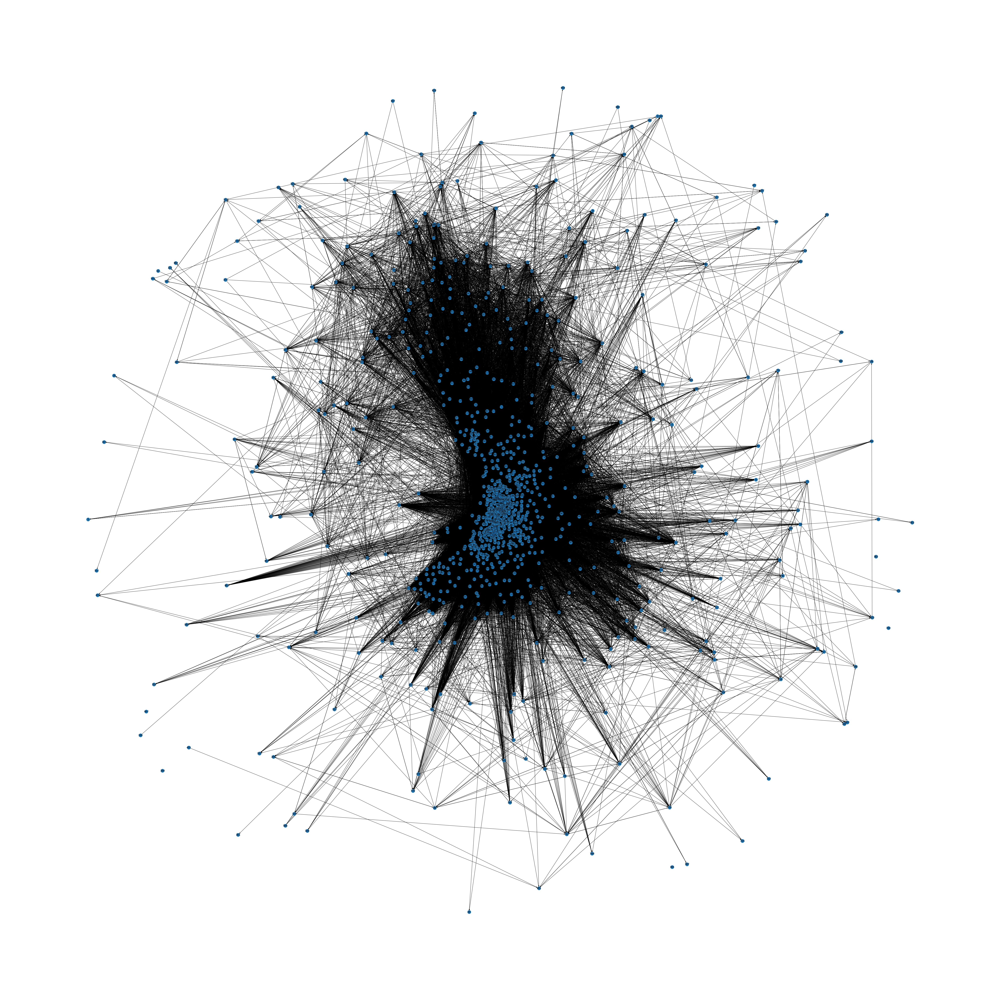

In [96]:
# visualize the network
pos = nx.spring_layout(G,k=10.1*2/np.sqrt(len(G.nodes())), iterations=70)
plt.figure(60, figsize=(70, 70))
nx.draw(G, pos=pos, with_labels=False)
nx.draw_networkx_labels(G,pos=pos, with_labels=False)
plt.show()

In [97]:
# number of self-loop edge
nx.number_of_selfloops(G)

845

In [98]:
df[df['start_station_name'].notna() == df['end_station_name'].notna()].shape

(8455672, 21)

In [99]:
# get weakly connected nodes
sorted(nx.weakly_connected_components(G))[1:]

[{667}, {165}, {760}, {264}, {363}]

In [100]:
weakly_connected_nodes = [i for k in sorted(nx.weakly_connected_components(G))[1:] for i in k]

In [101]:
# get stations names
all_stations.iloc[[i for i in weakly_connected_nodes]]\
                        .reset_index()

,station,index
0,Indiana Ave & 133Rd St,667
1,Mtl-Eco5.1-01,165
2,S Wentworth Ave & W 111Th St,760
3,Throop/Hastings Mobile Station,264
4,Watson Testing - Divvy,363


In [102]:
# get the local clustering coefficent of each of them
nx.clustering(G, [i for i in weakly_connected_nodes])

{667: 0, 165: 0, 760: 0, 264: 0, 363: 0}

In [103]:
# get the average clustering
nx.average_clustering(G)

0.6173845423965465

In [105]:
all_stations = all_stations.reset_index().set_index('index')

In [106]:
# get the centrality metrics 
centrality_metrics = pd.DataFrame(dict(
    in_degree = nx.in_degree_centrality(G),
    out_degree = nx.out_degree_centrality(G),
))

In [107]:
centrality_metrics

,in_degree,out_degree
115,0.202765,0.167051
590,0.327189,0.300691
668,0.455069,0.458525
215,0.344470,0.362903
858,0.465438,0.488479
...,...,...
375,0.000000,0.003456
760,0.001152,0.001152
264,0.001152,0.001152
331,0.000000,0.002304


In [108]:
# map station name based on the index then get the in-degree and out-degree scores
centrality_metrics['station'] = centrality_metrics.index.map(all_stations.station)
in_ = centrality_metrics.sort_values(by=['in_degree'], ascending=False).head(100)[['station', 'in_degree']]
out_ = centrality_metrics.sort_values(by=['out_degree'], ascending=False).head(100)[['station', 'out_degree']]

In [109]:
# top in-degree centrality stations
in_

,station,in_degree
820,Streeter Dr & Grand Ave,0.601382
653,Millennium Park,0.573733
857,State St & Randolph St,0.551843
34,Lake Shore Dr & Monroe St,0.548387
194,Indiana Ave & Roosevelt Rd,0.548387
...,...,...
784,Lake Shore Dr & Belmont Ave,0.473502
354,Pine Grove Ave & Waveland Ave,0.473502
308,Clark St & Grace St,0.472350
561,Western Ave & Winnebago Ave,0.471198


In [110]:
# top out-degree centrality stations
out_

,station,out_degree
820,Streeter Dr & Grand Ave,0.604839
653,Millennium Park,0.581797
205,Michigan Ave & Oak St,0.571429
48,Wabash Ave & Grand Ave,0.566820
366,Ashland Ave & Division St,0.563364
...,...,...
533,Pine Grove Ave & Irving Park Rd,0.489631
614,Damen Ave & Thomas St (Augusta Blvd),0.489631
674,Dusable Harbor,0.489631
727,Shedd Aquarium,0.488479


In [111]:
# get only high in-degree centrality stations
in_[~in_['station'].isin(list(set(in_['station'].to_list()) & set(out_['station'].to_list())))].head(10)

,station,in_degree
213,Noble St & Milwaukee Ave,0.490783
106,State St & Van Buren St,0.487327
807,Ogden Ave & Chicago Ave,0.487327
360,Western Ave & Walton St,0.485023
700,Lakefront Trail & Bryn Mawr Ave,0.481567
154,Sheffield Ave & Kingsbury St,0.481567
330,Halsted St & Dickens Ave,0.479263
729,Burnham Harbor,0.476959
361,Southport Ave & Roscoe St,0.475806
486,Adler Planetarium,0.475806


In [112]:
# get only high out-degree centrality stations
out_[~out_['station'].isin(list(set(in_['station'].to_list()) & set(out_['station'].to_list())))].head(10)

,station,out_degree
714,Canal St & Adams St,0.519585
702,Michigan Ave & Madison St,0.517281
235,Clark St & Schiller St,0.509217
136,State St & Pearson St,0.509217
69,Michigan Ave & Pearson St,0.508065
471,New St & Illinois St,0.505760
648,Damen Ave & Division St,0.504608
92,Wabash Ave & Adams St,0.502304
26,Clinton St & Washington Blvd,0.500000
290,Dearborn St & Adams St,0.496544


In [113]:
# get stations with high in-degree and out-degree centrality
both_c = list(pd.Series(list(set(in_['station']).intersection(set(out_['station'])))))
both_c = centrality_metrics[centrality_metrics['station'].isin(both_c)]
both_c = both_c.sort_values(by=['in_degree', 'out_degree'], ascending=False)

In [114]:
both_c

,in_degree,out_degree,station
820,0.601382,0.604839,Streeter Dr & Grand Ave
653,0.573733,0.581797,Millennium Park
857,0.551843,0.544931,State St & Randolph St
205,0.548387,0.571429,Michigan Ave & Oak St
194,0.548387,0.542627,Indiana Ave & Roosevelt Rd
...,...,...,...
88,0.478111,0.495392,Halsted St & Wrightwood Ave
449,0.476959,0.512673,Rush St & Cedar St
419,0.475806,0.496544,Eckhart Park
458,0.474654,0.502304,Franklin St & Jackson Blvd
